In [1]:
from __future__ import annotations

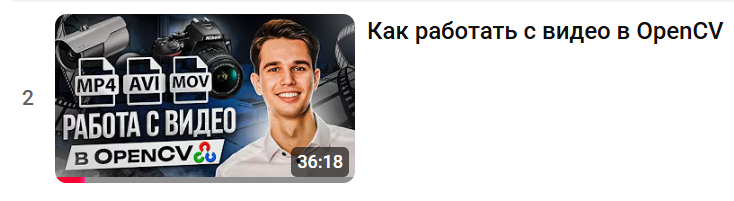

### Camera Streaming

In [2]:
import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Failed to open a camera")

# Set HD resolution
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 1280)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 720)

while True:
    # Video stream
    ret, frame = cap.read()

    # Checking if the frame was captured successfully
    if not ret:
        print("Failed to get a frame from the camera")
        break

    cv2.imshow(winname="Lenovo Legion 5 Pro webcam", mat=frame)
        
    # Exit from the loop
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()  # Close the camera
cv2.destroyAllWindows()

### Image processing

In [3]:
import numpy as np

def convert_to_grayscale(frame):
    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    return gray_frame

Launch gray scale streaming

In [4]:
import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("A camera is busy now.")

while True:
    ret, frame = cap.read()

    if not ret:
        print("Fail to load a frame")
        break

    frame = convert_to_grayscale(frame)

    # Resize a frame
    scale = 0.8
    frame = cv2.resize(frame, (-1, -1), fx=scale, fy=scale)

    cv2.imshow("Camera", frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

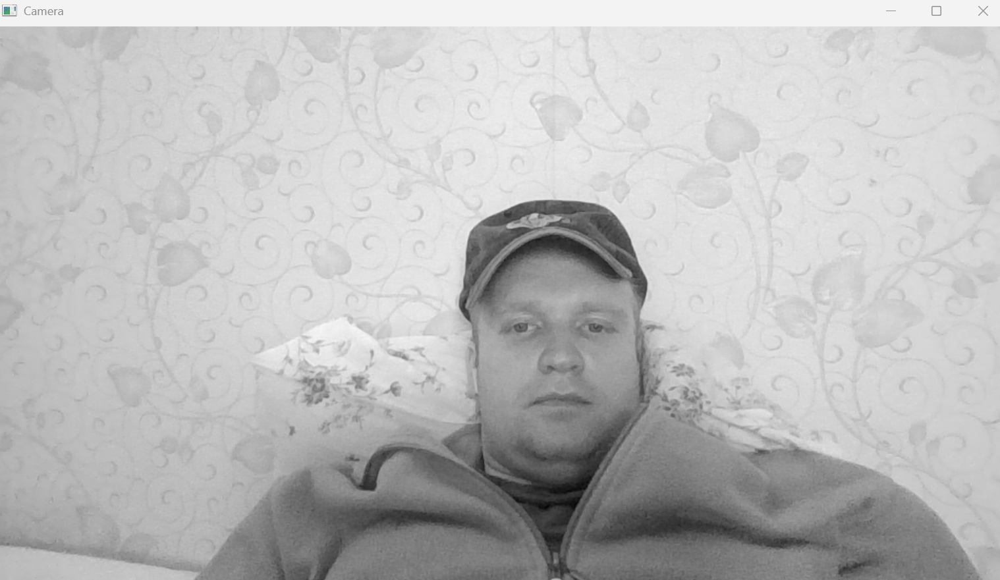

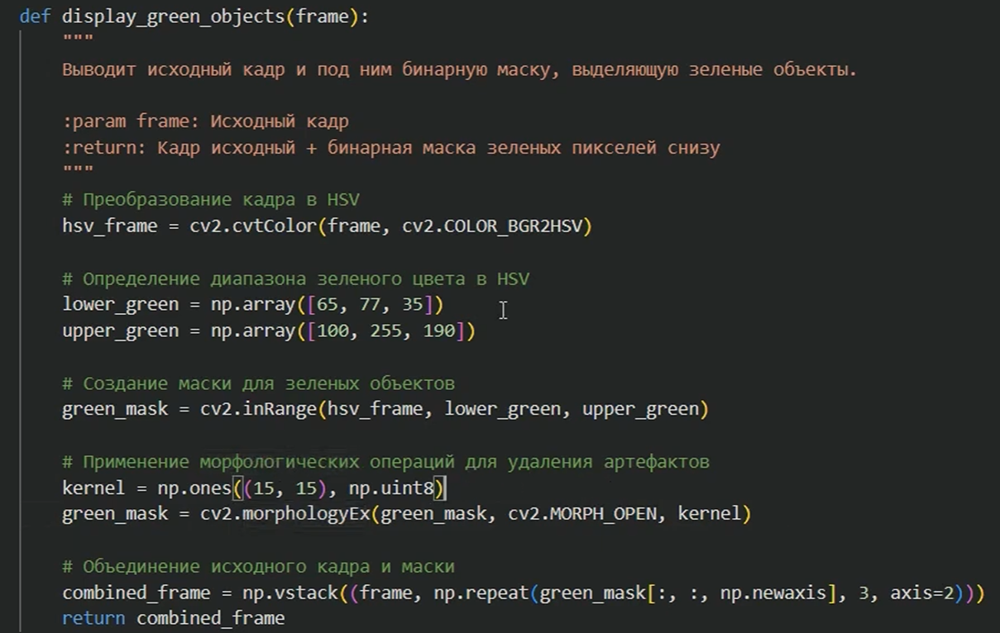
Что-то на подобии сегментации сорняков задачи.

### FPS Counter

In [5]:
import time
from collections import deque

class FPSCounter:
    def __init__(self, calc_time_frames: int) -> None:
        self.time_buffer = deque(maxlen=calc_time_frames)

    def calculate_fps(self) -> float:
        t = time.perf_counter()
        self.time_buffer.append(t)

        if len(self.time_buffer) < 2:
            return 0.0

        fps = (len(self.time_buffer) - 1) / (self.time_buffer[-1] - self.time_buffer[0])
        return round(fps, 2)
    
    def calculate_show_fps(self, frame: FPSCounter) -> any:
        fps_real = self.calculate_fps()
        text = f"FPS: {fps_real:.1f}"

        # Параметры для шрифтов:
        fontFace = 1          # тип шрифта (1 = FONT_HERSHEY_SIMPLEX)
        fontScale = 1.3       # размер шрифта
        thickness = 1         # толщина линий

        # Получаем размеры (ширину и высоту) текста в пикселях
        (label_width, label_height), _ = cv2.getTextSize(
            text,                     # сам текст
            fontFace=fontFace,        # тип шрифта
            fontScale=fontScale,      # размер шрифта
            thickness=thickness,      # толщина
        )

        # Рисуем чёрный прямоугольник (фон для текста)
        frame = cv2.rectangle(
            frame,                                    # исходное изображение
            (0, 0),                                   # верхний левый угол
            (10 + label_width, 15 + label_height),    # нижний правый угол
            (0, 0, 0),                                # цвет: чёрный (BGR)
            -1                                        # -1 = заливка (заполнить весь прямоугольник)
        )

        # Рисуем белый текст поверх чёрного прямоугольника
        frame = cv2.putText(
            img=frame,               # изображение
            text=text,               # текст
            org=(5, 20),             # координаты нижнего левого угла текста
            fontFace=fontFace,       # тип шрифта
            fontScale=fontScale,     # размер шрифта
            thickness=thickness,     # толщина
            color=(255, 255, 255),   # цвет: белый (BGR)
        )

        return frame

In [6]:
import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Fail to switch on a camera")

fps_counter = FPSCounter(24)

while True:
    ret, frame = cap.read()

    if not ret:
        print("Fail to launch a frame")
        break
    
    frame = fps_counter.calculate_show_fps(frame)
    # frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    cv2.imshow(winname="Camera", mat=frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()    

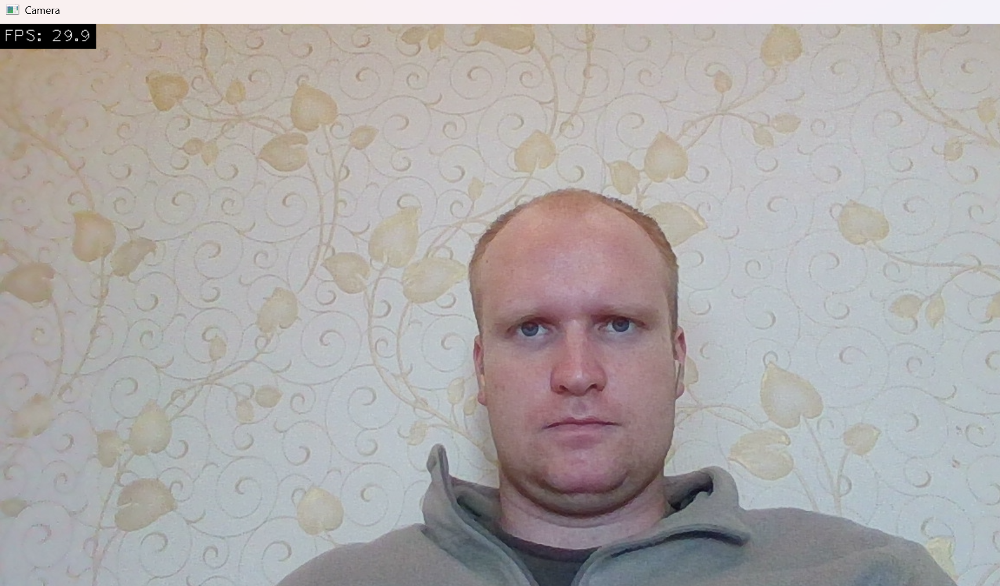

### YOLO custom library for small objects

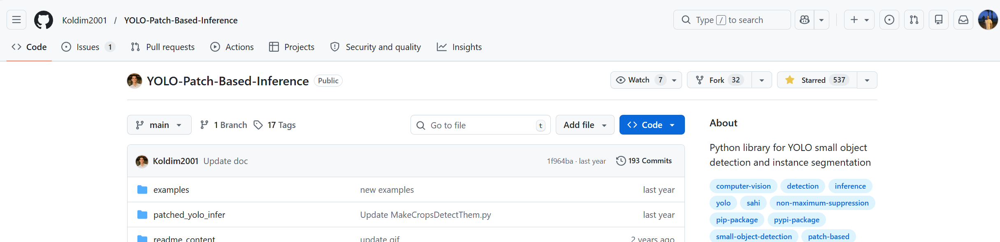

In [7]:
# !pip install patched_yolo_infer

In [8]:
from ultralytics import YOLO
from patched_yolo_infer import visualize_results_usual_yolo_inference

In [9]:
import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Failed to open a camera")

ret, frame = cap.read()

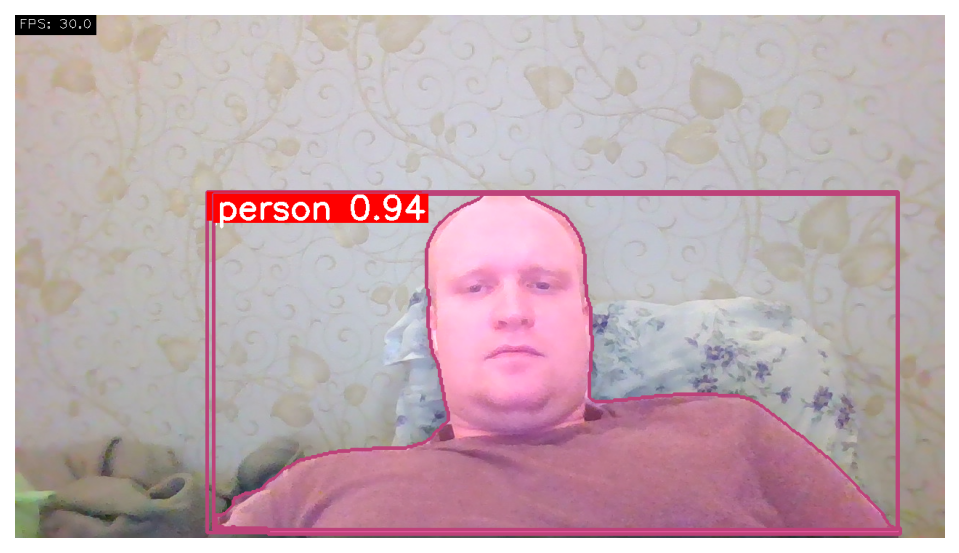

In [22]:
model = YOLO("yolo26m-seg.pt")
visualize_results_usual_yolo_inference(frame, model, imgsz=640, conf=0.7, segment=True, show_confidences=True, alpha=0.5, fill_mask=True)

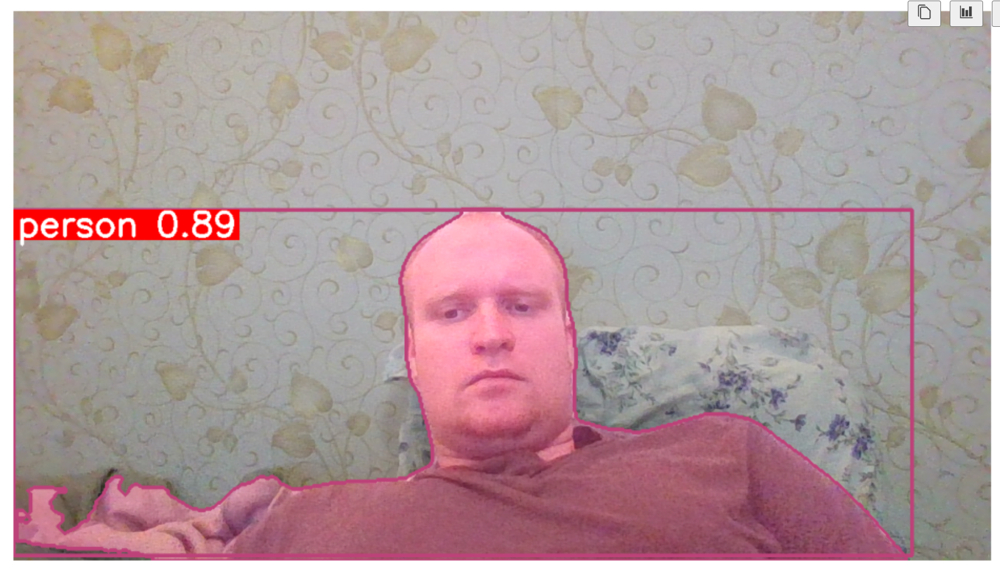

In [11]:
cap.release()

### Realtime Instance segmentation

In [23]:
import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Fail to switch on a camera")

fps_counter = FPSCounter(24)

while True:
    ret, frame = cap.read()

    if not ret:
        print("Fail to launch a frame")
        break
    
    frame = visualize_results_usual_yolo_inference(
        frame, 
        model, 
        imgsz=640,
        delta_colors=3, 
        conf=0.5, 
        segment=True, 
        show_confidences=True, 
        alpha=0.5, 
        fill_mask=True,
        return_image_array=True
    )
    frame = fps_counter.calculate_show_fps(frame)
    # frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    cv2.imshow(winname="Camera", mat=frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()    

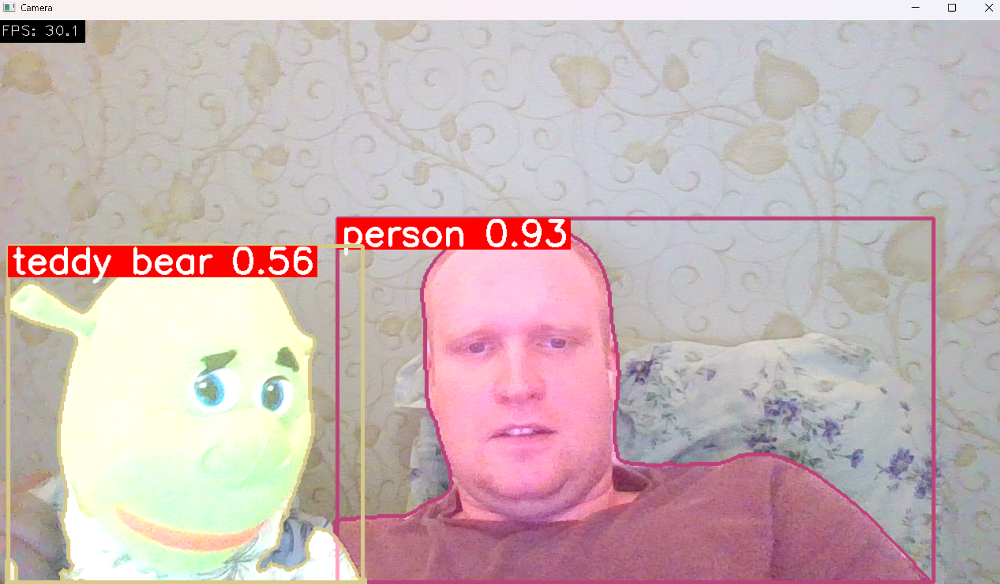

My Ogre David. He is not a teddy bear.

### Realtime detection

In [ ]:
import cv2

cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Fail to switch on a camera")

fps_counter = FPSCounter(24)

while True:
    ret, frame = cap.read()

    if not ret:
        print("Fail to launch a frame")
        break
    
    model = YOLO("yolo26m.pt")
    frame = visualize_results_usual_yolo_inference(
        frame, 
        model, 
        imgsz=640,
        delta_colors=3, 
        conf=0.5, 
        segment=False,
        show_boxes=True, 
        show_confidences=True,
        return_image_array=True
    )
    frame = fps_counter.calculate_show_fps(frame)
    # frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    cv2.imshow(winname="Detection", mat=frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()    

Detection works almost in 8 times slower than segmentation. I don't know why.